In [87]:
def preview (df):
    print(f'The dataframe shape is {df.shape}')
    preview_df=pd.DataFrame({'Data Types':df.dtypes,'Total Null Values':df.isna().sum(), 'Null Values Percentage':df.isna().sum()*100/df.shape[0],'Sample Value Head':df.head(1).T.iloc[:,0], 'Sample Value Tail':df.tail(1).T.iloc[:,0]})
    preview_df.rename_axis('Column_Name',inplace=True)
    return preview_df

***

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import re
import seaborn as sns

from sklearn.preprocessing import OneHotEncoder

In [297]:
df=pd.read_csv('../data/interim/df_merged.csv',index_col=0).reset_index(drop=True)

#Change the type to datetime
df['ISSUE_DATE']=df['ISSUE_DATE'].astype('datetime64')
df.shape

(702310, 36)

* [X] Converting Categorical into Numberical (One-Hot Encoding)
* [X] Grouping by Census_Tract & Year

---
**Dataframge Shape Aim:**
| `Census Tract` | `Year` | Median Earnings | Numerical X Feature 1 |Numerical X Feature n |
| --- | --- | --- | --- | --- |
| 10100 | 2021 | XXX |XXX |XXX |
| 10100 | 2020 | XXX |XXX |XXX |
| 10100 | 2019 | XXX |XXX |XXX |
| --- | --- | --- | --- |--- |

In [90]:
#Split into numeric and object columns
df_num=df.select_dtypes("number")
df_obj=df.select_dtypes("object")

In [298]:
preview(df)

The dataframe shape is (702310, 36)


,Data Types,Total Null Values,Null Values Percentage,Sample Value Head,Sample Value Tail
Column_Name,,,,,
ID,int64,0,0.0,1614287,1857996
PERMIT_TYPE,object,0,0.0,RENOVATION/ALTERATION,ELECTRIC WIRING
REVIEW_TYPE,object,0,0.0,STANDARD PLAN REVIEW,EASY PERMIT WEB
ISSUE_DATE,datetime64[ns],0,0.0,2006-01-03 00:00:00,2007-10-23 00:00:00
PROCESSING_TIME,float64,0,0.0,81.0,6.0
WORK_DESCRIPTION,object,0,0.0,INTERIOR REMODELING OF EXISTING 3 D.U. PER PLA...,INSTALLATION OF (1) 30 AMP DUAL POLE BREAKER A...
BUILDING_FEE_PAID,float64,0,0.0,125.0,40.0
ZONING_FEE_PAID,float64,0,0.0,75.0,0.0
OTHER_FEE_PAID,float64,0,0.0,0.0,0.0


In [299]:
df_obj.head(5)

,PERMIT_TYPE,REVIEW_TYPE,WORK_DESCRIPTION,CONTACT_1_TYPE,CONTACT_1_CITY,CONTACT_1_STATE
0,RENOVATION/ALTERATION,STANDARD PLAN REVIEW,INTERIOR REMODELING OF EXISTING 3 D.U. PER PLA...,OWNER AS GENERAL CONTRACTOR,CHICAGO,IL
1,PORCH CONSTRUCTION,STANDARD PLAN REVIEW,REPLACE REAR OPEN WOOD PORCH WITH A NEW STEEL/...,ARCHITECT,CRYSTAL LAKE,IL
2,RENOVATION/ALTERATION,STANDARD PLAN REVIEW,DECONVERT 2ND FLOOR APARTMENT TO MAKE BUILDING...,ARCHITECT,PARK RIDGE,IL
3,ELECTRIC WIRING,EASY PERMIT WEB,LOW VOLTAGE BURGLAR ALARM,CONTRACTOR-ELECTRICAL,IRVING,TX
4,PORCH CONSTRUCTION,STANDARD PLAN REVIEW,REPAIR EXISTNG TWO STORY WOOD FRAME PORCH PER ...,OWNER AS GENERAL CONTRACTOR,CHICAGO,IL


In [300]:
#Consider the number of unique categories to determine the appropriatness of OneHotEncoding
df_obj.nunique()

PERMIT_TYPE             11
REVIEW_TYPE             11
WORK_DESCRIPTION    265285
CONTACT_1_TYPE          27
CONTACT_1_CITY        1777
CONTACT_1_STATE        151
dtype: int64

In [301]:
#Select columns that are appropriate to be OneHotEncoded
ohe_col=['PERMIT_TYPE','REVIEW_TYPE','CONTACT_1_TYPE']
df_temp=df[ohe_col]

#Instantiate the encoder
enc = OneHotEncoder(sparse=False)
#Encode
df_ohe=enc.fit_transform(df_temp)

#Add prefixes to OHE column names
col_names=['PERMIT_TYPE_'+i for i in enc.categories_[0]]+['REVIEW_TYPE_'+i for i in enc.categories_[1]]+['CONTACT_1_TYPE_'+i for i in enc.categories_[2]]

#Create a new DataFrame with encoded data
df_X_obj_mod=pd.DataFrame(df_ohe,columns=col_names)

#Create a copy of the existing DataFrame & drop the encoded columns
df_ohe_wip=df.drop(columns=ohe_col)

#Combine the non-encoded and encoded columns
df_ohe=pd.concat([df_ohe_wip,df_X_obj_mod],axis=1)

print(df_ohe.shape)
df_ohe.head()

(702310, 82)


,ID,ISSUE_DATE,PROCESSING_TIME,WORK_DESCRIPTION,BUILDING_FEE_PAID,ZONING_FEE_PAID,OTHER_FEE_PAID,SUBTOTAL_PAID,BUILDING_FEE_UNPAID,ZONING_FEE_UNPAID,...,CONTACT_1_TYPE_OWNER AS ARCHITECT & CONTRACTR,CONTACT_1_TYPE_OWNER AS GENERAL CONTRACTOR,CONTACT_1_TYPE_OWNER OCCUPIED,CONTACT_1_TYPE_PLUMBING CONTRACTOR,CONTACT_1_TYPE_RESIDENTAL REAL ESTATE DEV,CONTACT_1_TYPE_SELF CERT ARCHITECT,CONTACT_1_TYPE_SIGN CONTRACTOR,CONTACT_1_TYPE_STRUCTURAL ENGINEER,CONTACT_1_TYPE_TENT CONTRACTOR,CONTACT_1_TYPE_UNKNOWN
0,1614287,2006-01-03,81.0,INTERIOR REMODELING OF EXISTING 3 D.U. PER PLA...,125.0,75.0,0.0,200.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1682393,2006-06-27,36.0,REPLACE REAR OPEN WOOD PORCH WITH A NEW STEEL/...,200.0,50.0,0.0,250.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1695282,2006-08-01,0.0,DECONVERT 2ND FLOOR APARTMENT TO MAKE BUILDING...,85.0,75.0,0.0,160.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1638855,2006-01-12,9.0,LOW VOLTAGE BURGLAR ALARM,40.0,0.0,0.0,40.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1700937,2006-08-02,13.0,REPAIR EXISTNG TWO STORY WOOD FRAME PORCH PER ...,85.0,50.0,0.0,135.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [302]:
df_clean=df_ohe.copy()

In [303]:
df_clean['Year']=df_clean['ISSUE_DATE'].dt.year
df_clean.drop(columns='ISSUE_DATE').head();

* [ ] The difference in the date(time) granulairy will have to be address
    * However, at this stage the optimal timeframes are not yet decided
    * Hence, there are 2 different time divisions
    * To formulate an estmiate of the optimal time periods to consider, let's look at the neighbourhoods with the nighest levels of gentrification in the past 10 years

In [304]:
df_clean=df_clean.groupby(['Census_Tract','Year']).mean()
df_clean.reset_index()

,Census_Tract,Year,ID,PROCESSING_TIME,BUILDING_FEE_PAID,ZONING_FEE_PAID,OTHER_FEE_PAID,SUBTOTAL_PAID,BUILDING_FEE_UNPAID,ZONING_FEE_UNPAID,...,CONTACT_1_TYPE_OWNER AS ARCHITECT & CONTRACTR,CONTACT_1_TYPE_OWNER AS GENERAL CONTRACTOR,CONTACT_1_TYPE_OWNER OCCUPIED,CONTACT_1_TYPE_PLUMBING CONTRACTOR,CONTACT_1_TYPE_RESIDENTAL REAL ESTATE DEV,CONTACT_1_TYPE_SELF CERT ARCHITECT,CONTACT_1_TYPE_SIGN CONTRACTOR,CONTACT_1_TYPE_STRUCTURAL ENGINEER,CONTACT_1_TYPE_TENT CONTRACTOR,CONTACT_1_TYPE_UNKNOWN
0,10100,2006,1.685207e+06,18.881716,1398.327778,37.777778,132.711111,1568.816667,11.111111,0.0,...,0.0,0.177778,0.000000,0.0,0.0,0.022222,0.022222,0.022222,0.000000,0.000000
1,10100,2007,1.753346e+06,143.816667,1655.281000,46.666667,17.083333,1719.031000,0.000000,0.0,...,0.0,0.133333,0.000000,0.0,0.0,0.000000,0.000000,0.016667,0.000000,0.066667
2,10100,2008,1.914441e+06,43.516129,1987.376452,54.838710,40.322581,2082.537742,0.000000,0.0,...,0.0,0.129032,0.064516,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,10100,2009,2.055682e+06,69.000000,258.618261,45.108696,1.086957,304.813913,0.000000,0.0,...,0.0,0.152174,0.021739,0.0,0.0,0.000000,0.021739,0.239130,0.000000,0.000000
4,10100,2010,2.193302e+06,11.812500,386.102188,44.531250,53.156250,483.789688,0.000000,0.0,...,0.0,0.062500,0.031250,0.0,0.0,0.031250,0.031250,0.031250,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13386,843900,2019,3.053520e+06,5.809524,479.919048,98.809524,6.595238,585.323810,7.142857,0.0,...,0.0,0.071429,0.071429,0.0,0.0,0.071429,0.000000,0.000000,0.095238,0.095238
13387,843900,2020,3.129540e+06,9.981818,882.835273,64.090909,95.600000,1042.526182,0.000000,0.0,...,0.0,0.018182,0.054545,0.0,0.0,0.127273,0.127273,0.054545,0.000000,0.018182
13388,843900,2021,3.190975e+06,19.976744,675.817209,22.674419,1.744186,700.235814,134.148837,0.0,...,0.0,0.046512,0.069767,0.0,0.0,0.069767,0.000000,0.000000,0.046512,0.000000
13389,843900,2022,3.263468e+06,15.459459,1113.155946,44.594595,111.648649,1269.399189,5.675676,0.0,...,0.0,0.000000,0.189189,0.0,0.0,0.081081,0.000000,0.000000,0.081081,0.000000


---
* [ ] Look at top & bottom 5 census tracts by the % change from 2010 to 2021 (the change proportional to 2010 income)

In [307]:
preview(df_clean)[10:40]

The dataframe shape is (13391, 77)


,Data Types,Total Null Values,Null Values Percentage,Sample Value Head,Sample Value Tail
Column_Name,,,,,
BUILDING_FEE_WAIVED,float64,0,0.0,232.186667,0.00
ZONING_FEE_WAIVED,float64,0,0.0,3.333333,0.00
OTHER_FEE_WAIVED,float64,0,0.0,0.000000,0.00
SUBTOTAL_WAIVED,float64,0,0.0,235.520000,0.00
TOTAL_FEE,float64,0,0.0,1815.447778,388.00
REPORTED_COST,float64,0,0.0,223203.755556,74348.00
Median_earnings_2010,float64,0,0.0,32631.000000,40117.00
Median_earnings_2011,float64,0,0.0,31860.000000,38897.00
Median_earnings_2012,float64,0,0.0,30455.000000,38247.00


In [308]:
#Let's find census track with the highest percentage incerase in the median income

df_temp=df_clean.groupby('Census_Tract').mean().loc[:,[bool(re.search(r'^Median',col)) for col in df_clean.columns]]

perc_change=df_temp.apply(lambda row: row['Median_earnings_2021']/row['Median_earnings_2010'],axis=1)*100
perc_change.sort_values()[-20:]
#['Median_earnings_2021']/df_clean['Median_earnings_2010']

Census_Tract
672000    214.294787
440900    214.872126
410200    216.351298
242900    223.452066
842900    230.982429
240700    232.631540
210601    246.773883
310400    247.688492
242700    248.490882
710100    252.322101
831300    261.875770
222800    262.126309
140100    274.994607
222500    285.304499
838300    289.886404
221400    298.059641
711100    310.575525
351500    376.759920
841000    405.026077
670400    507.240217
dtype: float64

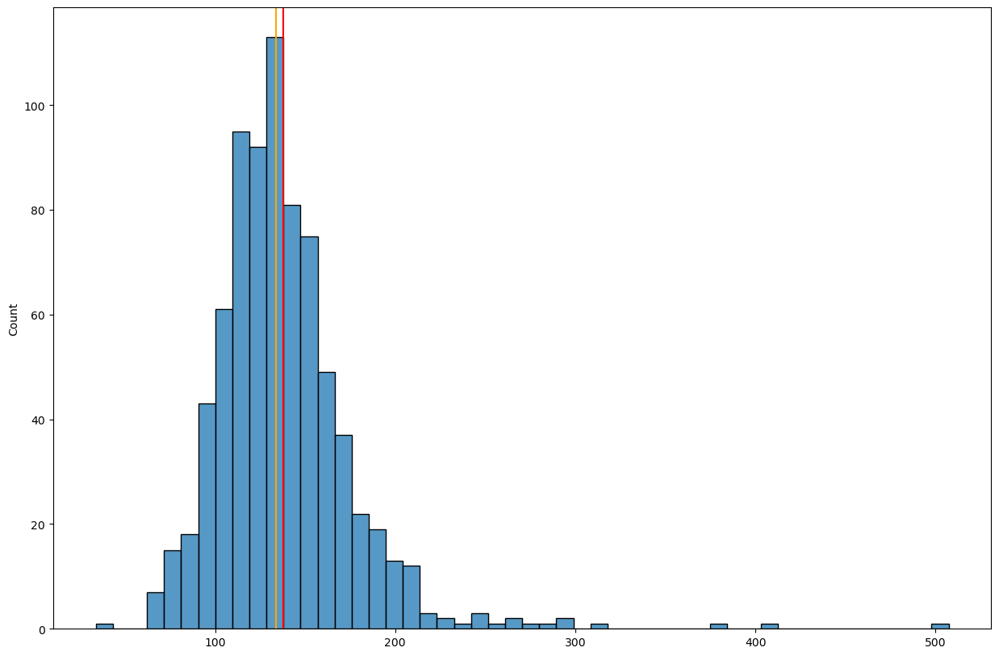

In [309]:
fig, ax =plt.subplots(figsize=(15,10))

sns.histplot(data=perc_change,bins=50)
plt.axvline(perc_change.mean(),color='red',label='mean')
plt.axvline(perc_change.median(),color='orange',label='median')

In [310]:
df_temp_2=pd.concat([df_temp,pd.DataFrame(df_temp.mean()).T])
df_temp_2

,Median_earnings_2010,Median_earnings_2011,Median_earnings_2012,Median_earnings_2013,Median_earnings_2014,Median_earnings_2015,Median_earnings_2016,Median_earnings_2017,Median_earnings_2018,Median_earnings_2019,Median_earnings_2020,Median_earnings_2021
10100,32631.000000,31860.000000,30455.000000,30795.000000,30175.000000,30641.000000,31107.000000,36985.000000,38076.000000,35985.000000,41424.000000,43829.000000
10201,30931.000000,29346.000000,29688.000000,28564.000000,30190.000000,32624.000000,35058.000000,31793.000000,33517.000000,33388.000000,35750.000000,36176.000000
10202,30136.000000,30408.000000,27299.000000,26417.000000,25214.000000,27703.000000,30192.000000,28791.000000,30237.000000,30104.000000,31212.000000,30365.000000
10300,40259.000000,40144.000000,36772.000000,34898.000000,36372.000000,35427.500000,34483.000000,34260.000000,35818.000000,38230.000000,39812.000000,46552.000000
10400,39303.000000,41913.000000,38242.000000,40688.000000,42364.000000,41331.000000,40298.000000,42088.000000,40921.000000,40333.000000,42526.000000,44372.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
843600,26898.000000,29188.000000,38547.000000,31646.000000,33698.000000,37038.000000,40378.000000,41304.000000,40801.000000,41818.000000,42800.000000,44407.000000
843700,49924.000000,54149.000000,60449.000000,55714.000000,54349.000000,58021.500000,61694.000000,61199.000000,80298.000000,86324.000000,93846.000000,93906.000000
843800,33526.000000,35440.000000,22311.000000,21083.000000,20700.000000,26575.000000,32450.000000,35810.000000,29063.000000,25901.000000,34479.000000,27049.000000
843900,40117.000000,38897.000000,38247.000000,30651.000000,34620.000000,34166.500000,33713.000000,45377.000000,48240.000000,44485.000000,49939.000000,52599.000000


In [313]:
#400% increase?

df_temp[df_temp.index==841000]

,Median_earnings_2010,Median_earnings_2011,Median_earnings_2012,Median_earnings_2013,Median_earnings_2014,Median_earnings_2015,Median_earnings_2016,Median_earnings_2017,Median_earnings_2018,Median_earnings_2019,Median_earnings_2020,Median_earnings_2021
Census_Tract,,,,,,,,,,,,
841000,21667.0,53500.0,58750.0,58516.0,43333.0,59114.5,74896.0,78667.0,83605.0,85798.0,84911.0,87757.0


In [314]:
df_temp[df_temp.index==838300]

,Median_earnings_2010,Median_earnings_2011,Median_earnings_2012,Median_earnings_2013,Median_earnings_2014,Median_earnings_2015,Median_earnings_2016,Median_earnings_2017,Median_earnings_2018,Median_earnings_2019,Median_earnings_2020,Median_earnings_2021
Census_Tract,,,,,,,,,,,,
838300,25441.0,25605.0,26310.0,27466.0,31522.0,36296.5,41071.0,41955.0,52865.0,74375.0,70357.0,73750.0


In [315]:
abs_change=df_temp.apply(lambda row: row['Median_earnings_2021']-row['Median_earnings_2010'],axis=1)
abs_change.sort_values()[-20:]

Census_Tract
222500    41473.0
50600     41630.0
832500    42175.0
242900    42907.0
836200    43295.0
80202     43307.0
62400     43426.0
843700    43982.0
221400    44300.0
242100    44842.0
320400    45233.0
51000     45787.0
51400     46300.0
240500    46897.0
838300    48309.0
411200    49512.0
70600     51023.0
70400     53325.0
62300     56895.0
841000    66090.0
dtype: float64

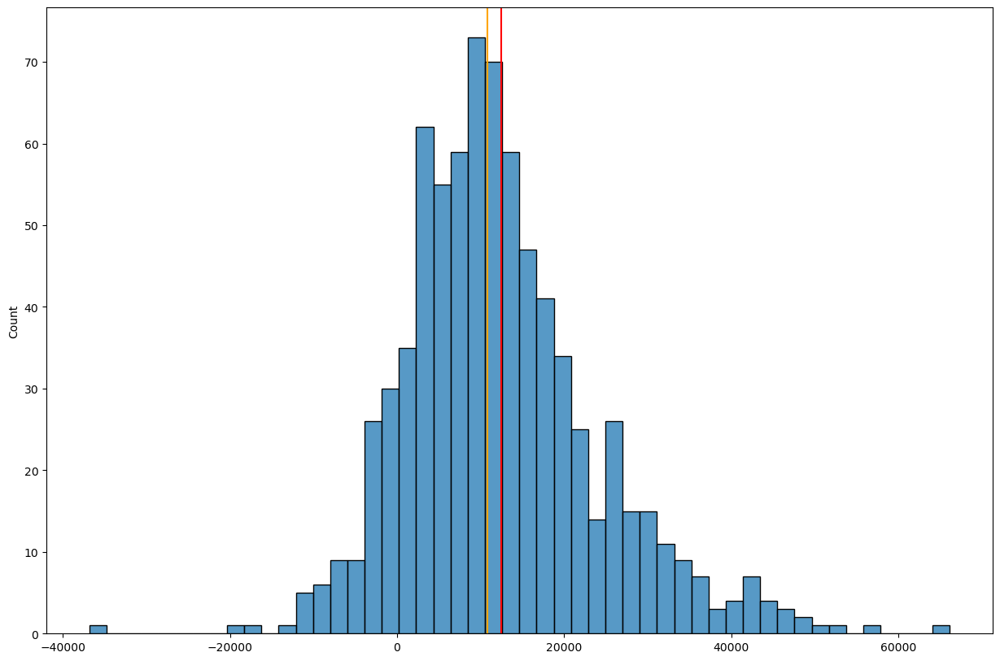

In [316]:
fig, ax = plt.subplots(figsize=(15,10))

sns.histplot(abs_change,bins=50)
plt.axvline(abs_change.mean(),color='red',label='mean')
plt.axvline(abs_change.median(),color='orange',label='median')

In [317]:
perc_change.sort_values()[-20::]

Census_Tract
672000    214.294787
440900    214.872126
410200    216.351298
242900    223.452066
842900    230.982429
240700    232.631540
210601    246.773883
310400    247.688492
242700    248.490882
710100    252.322101
831300    261.875770
222800    262.126309
140100    274.994607
222500    285.304499
838300    289.886404
221400    298.059641
711100    310.575525
351500    376.759920
841000    405.026077
670400    507.240217
dtype: float64

In [361]:
high_perc_change=perc_change.sort_values()[-10::].index
low_perc_change=perc_change.sort_values()[:10:].index


C:\Users\44742\AppData\Local\Temp\ipykernel_129620\4045985677.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


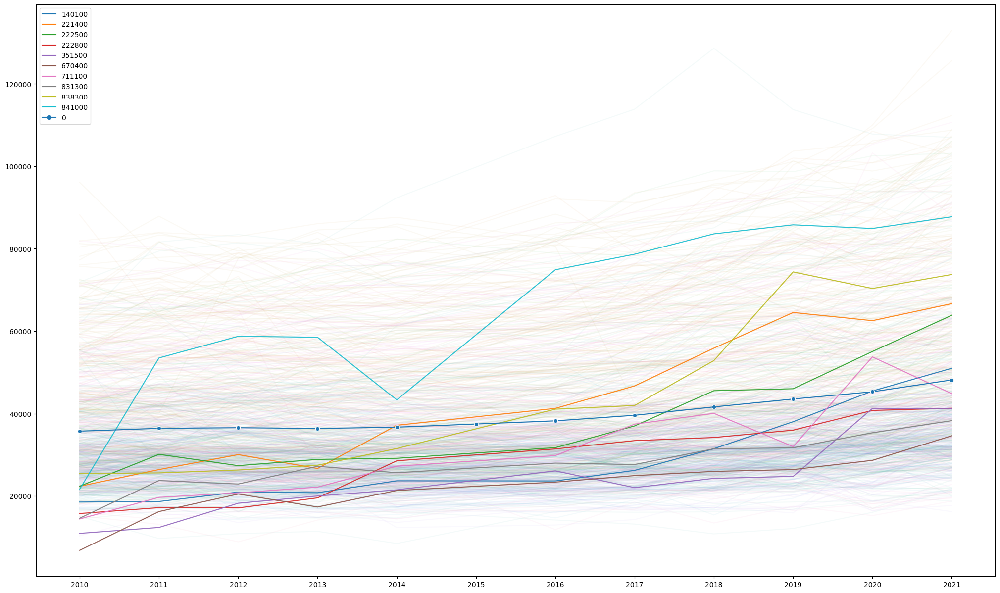

In [363]:

fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(high_perc_change)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\2496211021.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


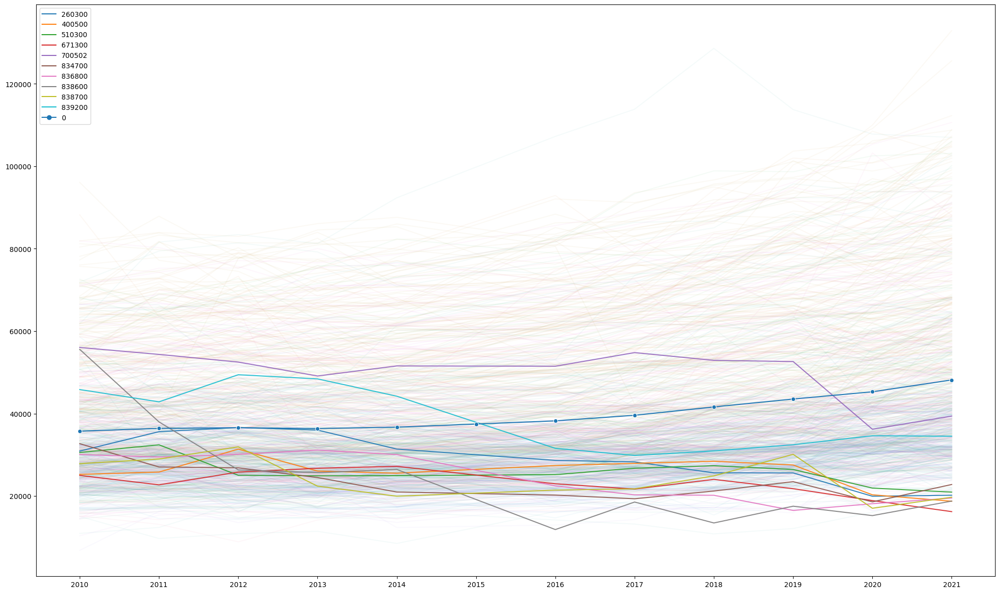

In [362]:

fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(low_perc_change)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show()

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\1137035229.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


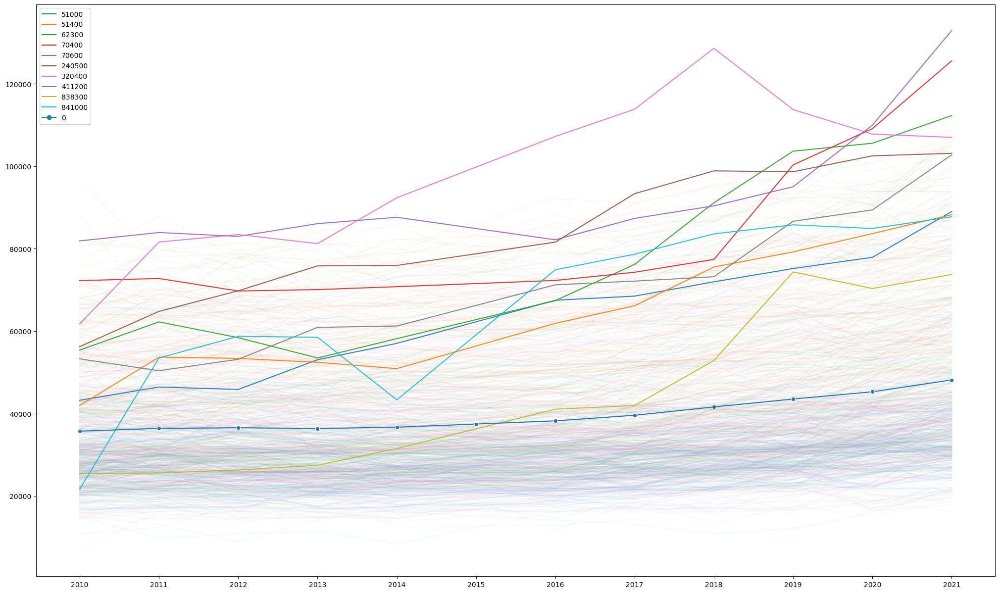

In [353]:
high_abs_change=abs_change.sort_values()[-10::].index

fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(high_abs_change)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

In [320]:
df_temp[df_temp.index==838600]

,Median_earnings_2010,Median_earnings_2011,Median_earnings_2012,Median_earnings_2013,Median_earnings_2014,Median_earnings_2015,Median_earnings_2016,Median_earnings_2017,Median_earnings_2018,Median_earnings_2019,Median_earnings_2020,Median_earnings_2021
Census_Tract,,,,,,,,,,,,
838600,55581.0,37978.0,26336.0,25650.0,26447.0,19154.5,11862.0,18542.0,13462.0,17530.0,15250.0,18768.0


***
<center><h2>High 5 year Absolute Change<center><h2>



* [ ] 2011 to 2016
* [ ] 2016 to 2021

In [332]:
abs_change_1=df_temp.apply(lambda row: row['Median_earnings_2016']-row['Median_earnings_2011'],axis=1)
abs_change_2=df_temp.apply(lambda row: row['Median_earnings_2021']-row['Median_earnings_2016'],axis=1)

abs_change_5y=pd.concat([abs_change_1,abs_change_2])

high_5y_change=abs_change_5y.sort_values(ascending=False)[:20].index

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\3291282481.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


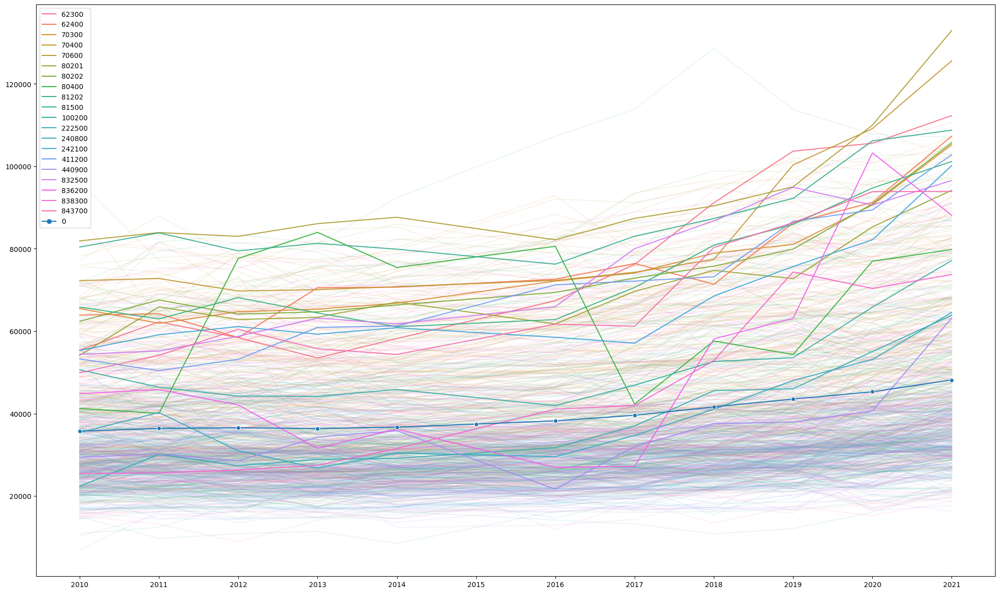

In [333]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.1,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(high_5y_change)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

In [291]:
#Let's find census track with the highest percentage incerase in the median income

df_temp=df_clean.groupby('Census_Tract').mean().loc[:,[bool(re.search(r'^Median',col)) for col in df_clean.columns]]
df_temp

,Median_earnings_2010,Median_earnings_2011,Median_earnings_2012,Median_earnings_2013,Median_earnings_2014,Median_earnings_2015,Median_earnings_2016,Median_earnings_2017,Median_earnings_2018,Median_earnings_2019,Median_earnings_2020,Median_earnings_2021
Census_Tract,,,,,,,,,,,,
10100,32631.0,31860.0,30455.0,30795.0,30175.0,30641.0,31107.0,36985.0,38076.0,35985.0,41424.0,43829.0
10501,31460.0,32718.0,29353.0,30225.0,27342.0,27359.5,27377.0,31524.0,31996.0,37430.0,37713.0,42844.0
10502,28605.0,30211.0,29750.0,30492.0,31307.0,31191.5,31076.0,31755.0,32198.0,35644.0,39178.0,43106.0
10503,27313.0,39153.0,43365.0,43482.0,48194.0,45198.0,42202.0,41762.0,37500.0,41875.0,47895.0,50034.0
20302,38262.0,33617.0,41867.0,45865.0,44643.0,45560.5,46478.0,49615.0,47306.0,53162.0,55403.0,55452.0
...,...,...,...,...,...,...,...,...,...,...,...,...
843300,24561.0,24496.0,16133.0,16179.0,14440.0,17208.0,19976.0,21016.0,19327.0,22077.0,25326.0,21000.0
843400,22417.0,25035.0,25425.0,22351.0,22197.0,21630.5,21064.0,22628.0,24628.0,27220.0,31571.0,29605.0
843700,49924.0,54149.0,60449.0,55714.0,54349.0,58021.5,61694.0,61199.0,80298.0,86324.0,93846.0,93906.0


***
<center><h2>High 5 year Percentage Change<center><h2>



In [351]:
perc_change_1=df_temp.apply(lambda row: row['Median_earnings_2016']/row['Median_earnings_2011'],axis=1)
perc_change_2=df_temp.apply(lambda row: row['Median_earnings_2021']/row['Median_earnings_2016'],axis=1)

perc_change_5y=pd.concat([perc_change_1,perc_change_2])

high_5y_perc=perc_change_5y.sort_values(ascending=False)[:20].index
low_5y_perc=perc_change_5y.sort_values()[:20].index

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\1259285038.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


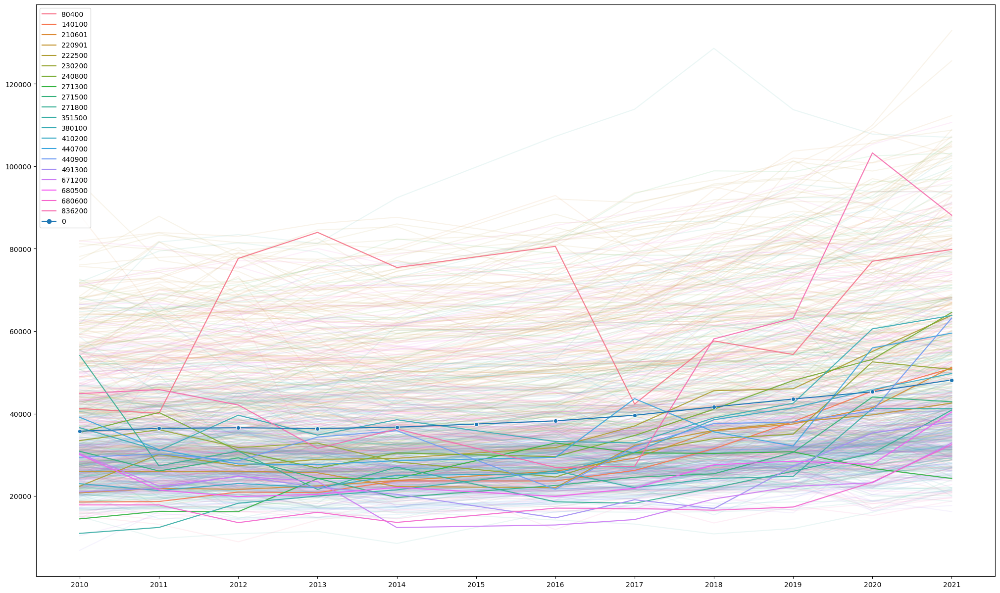

In [338]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.1,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(high_5y_perc)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\3757225944.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


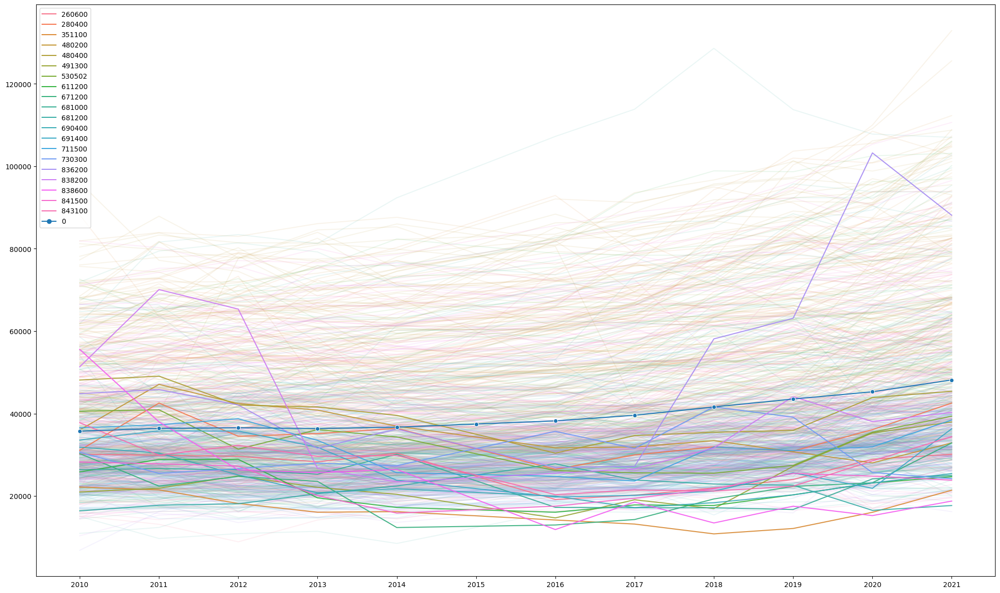

In [352]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.1,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(low_5y_perc)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

***
<center><h2>High 5 year Percentage&Absolute Combined Change<center><h2>



In [373]:
mix_change_1=df_temp.apply(lambda row: (row['Median_earnings_2016']/row['Median_earnings_2011'])*(row['Median_earnings_2016']-row['Median_earnings_2011']),axis=1)
mix_change_2=df_temp.apply(lambda row: (row['Median_earnings_2021']/row['Median_earnings_2016'])*(row['Median_earnings_2021']-row['Median_earnings_2016']),axis=1)

mix_change_5y=pd.concat([mix_change_1,mix_change_2])

high_5y_mix=mix_change_5y.sort_values(ascending=False)[:10].index
low_5y_mix=mix_change_5y.sort_values()[:10].index

low_5y_mix_1=mix_change_1.sort_values()[:10].index
low_5y_mix_2=mix_change_2.sort_values()[:10].index

In [374]:
mix_change_5y.sort_values()

Census_Tract
838200    -16228.507726
81401     -15278.912961
480400    -11568.661593
60500     -11333.246741
836200    -11105.919970
              ...      
80400      81545.752809
70600      82116.670318
70400      92551.324851
440900    121276.222910
836200    200199.322443
Length: 1546, dtype: float64

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\1107812548.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


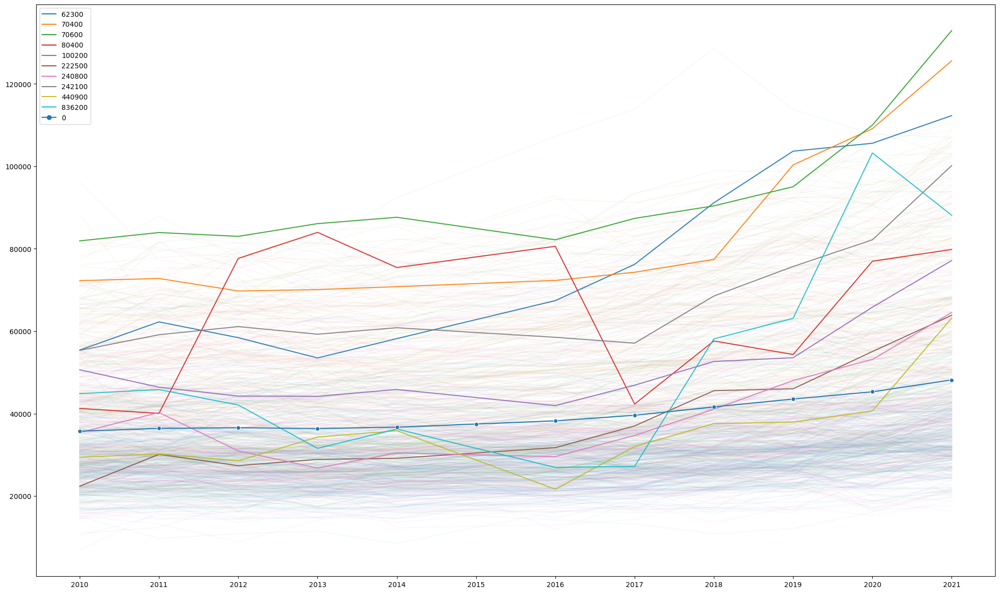

In [375]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(high_5y_mix)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\2072741594.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


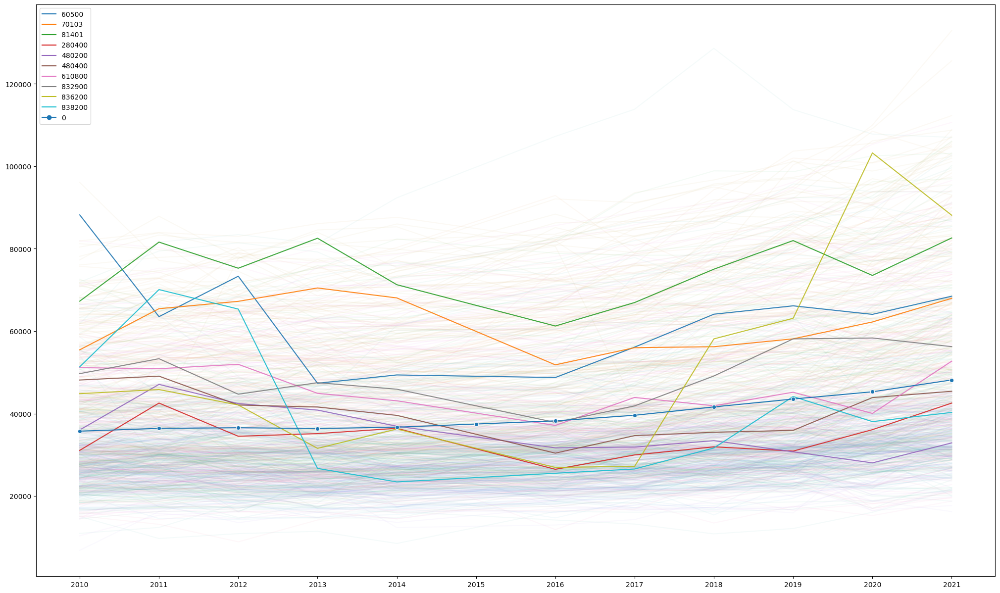

In [376]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(low_5y_mix_1)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

C:\Users\44742\AppData\Local\Temp\ipykernel_129620\3006552315.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(li)


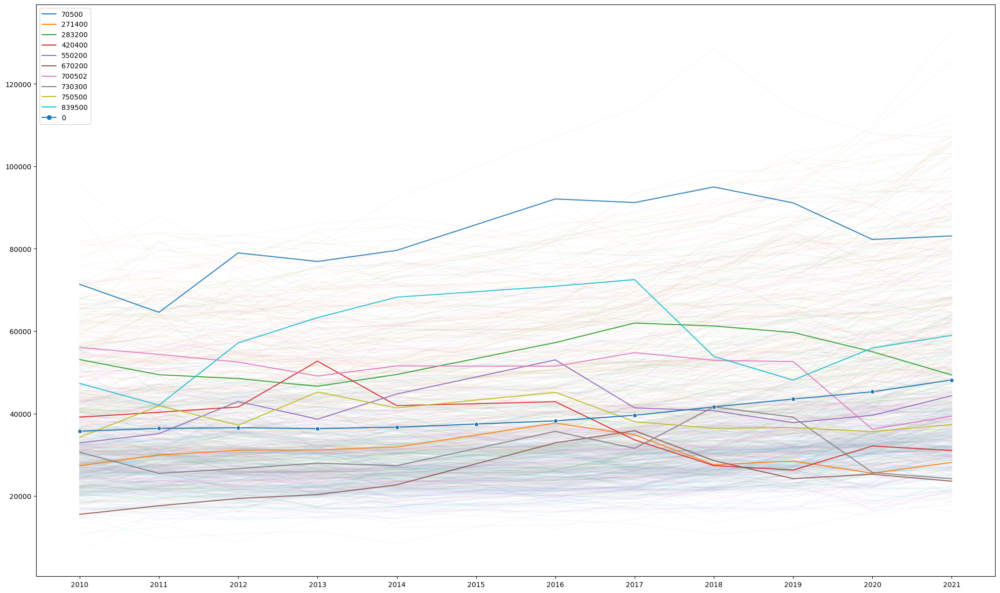

In [377]:
fig, ax = plt.subplots(figsize=(25,15))

sns.lineplot(data=df_temp.T,dashes=False,alpha=0.05,legend=False)
sns.lineplot(data=df_temp[df_temp.index.isin(low_5y_mix_2)].T,dashes=False,alpha=0.9,ax=ax)
sns.lineplot(data=df_temp_2[df_temp_2.index==0].T,markers=True)

li=[(i[-4::]) for i in df_temp_2.columns]
ax.set_xticklabels(li)


plt.show();

In [ ]:
df_clean.groupby(['Cenus_Tract',])